In [1]:
#!/usr/bin/env python3
# -*- coding: utf-8 -*-
import sys
import os
import glob
import numpy as np
import pandas as pd
import dask.dataframe as dd
import xarray as xr
import hvplot.xarray  # noqa
import seaborn as sns
from dask import delayed, compute
import itertools
from pytmatrix import tmatrix_aux, refractive, tmatrix, radar
from pymiecoated import Mie
from scipy.constants import c
from scipy import stats as ss
from scipy.optimize import minimize
from scipy.optimize import brentq
from scipy.special import gamma
from sqlalchemy.exc import OperationalError
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
from matplotlib.colors import LinearSegmentedColormap
from re import split
import matplotlib.dates as mdates
from dask_jobqueue import SLURMCluster
from dask.distributed import Client, progress
import dask.dataframe as dd
from dask import delayed, compute
from metpy.calc import pressure_to_height_std as p2h
from metpy.calc import lcl
import cartopy.crs as ccrs
import cartopy
import cartopy.mpl.ticker as cticker
import cartopy.io.img_tiles as cimgt
import cartopy.feature as cfeature
import warnings
import cython
warnings.filterwarnings('ignore')



sys.path.insert(1, f"{os.path.abspath(os.path.join(os.path.abspath(''), '../'))}")
from src.utils import get_pars_from_ini, make_dir

location = split(', |_|-|!', os.popen('hostname').read())[0].replace("\n", "")
path_data = get_pars_from_ini(file_name='loc')[location]['path_data']

/data/keeling/a/alfonso8/miniconda3/envs/camp2ex_proj/lib/python3.9/site-packages/dask/dataframe/backends.py:181: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  _numeric_index_types = (pd.Int64Index, pd.Float64Index, pd.UInt64Index)
/data/keeling/a/alfonso8/miniconda3/envs/camp2ex_proj/lib/python3.9/site-packages/dask/dataframe/backends.py:181: FutureWarning: pandas.Float64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  _numeric_index_types = (pd.Int64Index, pd.Float64Index, pd.UInt64Index)
/data/keeling/a/alfonso8/miniconda3/envs/camp2ex_proj/lib/python3.9/site-packages/dask/dataframe/backends.py:181: FutureWarning: pandas.UInt64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  _numeric_index_types = (pd.Int64Index, pd.Floa

In [2]:
def _scatterer(diameters, ar, wl, j=0, rt=tmatrix.Scatterer.RADIUS_MAXIMUM, forward=True):
    """
    Function that computes the scatterer object using pytmatrix package
    :param diameters: numpy array with diameters in mm
    :param ar: numpy array with axis ratio values
    :param wl: wavelength for which scatterer will be computed. e.g "Ka"
    :param j: Zenith angle input
    :param rt: maximum radius in mm
    :param forward: True if forward scattering geometry. False will use backward scattering geometry.
    :return: list of scatterers objects
    """
    if forward:
        gm = tmatrix_aux.geom_horiz_forw
    else:
        gm = tmatrix_aux.geom_horiz_back

    if wl == "Ku":
        wlg = tmatrix_aux.wl_Ku
        m = refractive.m_w_0C[tmatrix_aux.wl_Ku]
    elif wl == "Ka":
        wlg = tmatrix_aux.wl_Ka
        m = refractive.m_w_0C[tmatrix_aux.wl_Ka]
    elif wl == "W":
        wlg = tmatrix_aux.wl_W
        m = refractive.m_w_0C[tmatrix_aux.wl_W]
    else:
        raise Exception('wl {} not valid. Please use Ka, Ku, or W'.format(wl))

    return [tmatrix.Scatterer(radius=d / 2., wavelength=wlg, m=m, axis_ratio=1.0 / ar[idx], thet0=j,
                              thet=180 - j, phi0=0., phi=180., radius_type=rt,
                              geometry=gm) for idx, d in enumerate(diameters)]


def bck_extc_crss(diameters, instrument, _lower=300, _upper=1000, ar=None, j=0) -> pd.DataFrame:
    """
    Function that computes the backscatter and extinction cross-section for a particle.
    :param diameters: numpy array of diameters (mm) to which bcksct or extc will be computed.
    :param instrument: instrument for naming the database where bcksct or extc will be stored. e.g. "2DS"
    :param _lower: min diameter.
    :param _upper: max diameter
    :param ar: axis ratio numpy array
    :param j: Zenith angle input
    :return: Pandas dataframe with backscattering and extinction cross-section for Ku, Ka, and W band radar
    """

    try:
        path_db = f'{path_data}/cloud_probes/db'
        str_db = f"sqlite:///{path_db}/scattering_{_lower}_{_upper}.sqlite"
        df_scatter = pd.read_sql(f"{instrument}", con=str_db).set_index('index')
        return df_scatter
    except (OperationalError, ValueError):
        if not ar:
            andsager_ar: Callable[[float], float] = lambda d: 1.0048 + 0.0057 * d - 2.628 * d ** 2 + 3.682 * d ** 3 - \
                                                              1.677 * d ** 4
            ar = andsager_ar(diameters / 10)

        x_ku = 2 * np.pi * (diameters / 2.) / tmatrix_aux.wl_Ku
        x_ka = 2 * np.pi * (diameters / 2.) / tmatrix_aux.wl_Ka
        x_w = 2 * np.pi * (diameters / 2.) / tmatrix_aux.wl_W

        # Tmatrix calculations
        # forward scatterer
        ku_scatter_fw = _scatterer(diameters=diameters, ar=ar, wl='Ku', j=j)
        ka_scatter_fw = _scatterer(diameters=diameters, ar=ar, wl='Ka', j=j)
        w_scatter_fw = _scatterer(diameters=diameters, ar=ar, wl='W', j=j)

        # extinction cross-section
        ku_extinction = [ext_xsect(i) for i in ku_scatter_fw]
        ka_extinction = [ext_xsect(i) for i in ka_scatter_fw]
        w_extinction = [ext_xsect(i) for i in w_scatter_fw]

        # backward scatterer
        ku_scatter_bw = _scatterer(diameters=diameters, ar=ar, wl='Ku', j=j, forward=False)
        ka_scatter_bw = _scatterer(diameters=diameters, ar=ar, wl='Ka', j=j, forward=False)
        w_scatter_bw = _scatterer(diameters=diameters, ar=ar, wl='W', j=j, forward=False)

        # Backscattering cross-section
        ku_bckscatt = [radar.radar_xsect(i) for i in ku_scatter_bw]
        ka_bckscatt = [radar.radar_xsect(i) for i in ka_scatter_bw]
        w_bckscatt = [radar.radar_xsect(i) for i in w_scatter_bw]

        # Mie calculations
        mie_ku = [Mie(x=x_ku[w], m=refractive.m_w_0C[tmatrix_aux.wl_Ku]).qb() * np.pi * (i / 2.) ** 2 for w, i in
                  enumerate(diameters)]
        mie_ka = [Mie(x=x_ka[w], m=refractive.m_w_0C[tmatrix_aux.wl_Ka]).qb() * np.pi * (i / 2.) ** 2 for w, i in
                  enumerate(diameters)]
        mie_w = [Mie(x=x_w[w], m=refractive.m_w_0C[tmatrix_aux.wl_W]).qb() * np.pi * (i / 2.) ** 2 for w, i in
                 enumerate(diameters)]

        df_scatter = pd.DataFrame(
            {'T_mat_Ku': ku_bckscatt, 'T_mat_Ka': ka_bckscatt, 'T_mat_W': w_bckscatt, 'Mie_Ku': mie_ku, 'Mie_Ka': mie_ka,
             'Mie_W': mie_w, 'Ku_extc': ku_extinction, 'Ka_extc': ka_extinction, "W_extc": w_extinction}, index=diameters)
        path_db = f'{path_data}/cloud_probes/db'
        make_dir(path_db)
        str_db = f"sqlite:///{path_db}/scattering_{_lower}_{_upper}.sqlite"
        df_scatter.to_sql(f'{instrument}', con=str_db, if_exists='replace')
        return df_scatter


def radar_calc(nd, _lower, _upper, mie=False):
    ds = np.fromiter(nd.attrs['dsizes'].keys(), dtype=float) / 1e3
    try:
        path_db = f'{path_data}/cloud_probes/db'
        str_db = f"sqlite:///{path_db}/scattering_{_lower}_{_upper}.sqlite"
        backscatter = pd.read_sql(f"{nd.attrs['instrument']}", con=str_db)
    except (OperationalError, ValueError):
        backscatter = bck_extc_crss(ds, nd.attrs['instrument'], _lower=_lower, _upper=_upper)

    if len(ds) != backscatter.shape[0]:
        backscatter = bck_extc_crss(ds, nd.attrs['instrument'], _lower=_lower, _upper=_upper)

    dsizes = np.fromiter(nd.attrs['dsizes'].values(), dtype=float) / 1e3
    ku_wvl = c / 14e9 * 1000
    ka_wvl = c / 35e9 * 1000
    w_wvl = c / 95e9 * 1000
    wvl = ['z_Ku', 'z_Ka', 'z_W', 'A_Ku', 'A_Ka', 'A_W']
    if mie:
        z_ku = (ku_wvl ** 4 / (np.pi ** 5 * 0.93)) * nd.mul(1e6).mul(backscatter['Mie_Ku'].values,
                                                                     axis='columns').mul(dsizes)
        z_ka = (ka_wvl ** 4 / (np.pi ** 5 * 0.93)) * nd.mul(1e6).mul(backscatter['Mie_Ka'].values,
                                                                     axis='columns').mul(dsizes)
        z_w = (w_wvl ** 4 / (np.pi ** 5 * 0.93)) * nd.mul(1e6).mul(backscatter['Mie_W'].values,
                                                                   axis='columns').mul(dsizes)
    else:
        z_ku = (ku_wvl ** 4 / (np.pi ** 5 * 0.93)) * nd.mul(1e6).mul(backscatter['T_mat_Ku'].values,
                                                                     axis='columns').mul(dsizes)
        z_ka = (ka_wvl ** 4 / (np.pi ** 5 * 0.93)) * nd.mul(1e6).mul(backscatter['T_mat_Ka'].values,
                                                                     axis='columns').mul(dsizes)
        z_w = (w_wvl ** 4 / (np.pi ** 5 * 0.93)) * nd.mul(1e6).mul(backscatter['T_mat_W'].values,
                                                                   axis='columns').mul(dsizes)

    att_ku = (0.01 / np.log10(10)) * nd.mul(1e6).mul(backscatter['Ku_extc'].values,
                                                     axis='columns').mul(dsizes)
    att_ka = (0.01 / np.log10(10)) * nd.mul(1e6).mul(backscatter['Ka_extc'].values,
                                                     axis='columns').mul(dsizes)
    att_w = (0.01 / np.log10(10)) * nd.mul(1e6).mul(backscatter['W_extc'].values,
                                                    axis='columns').mul(dsizes)

    df_radar = pd.concat([z_ku, z_ka, z_w, att_ku, att_ka, att_w], axis=1, keys=wvl, levels=[wvl])
    return df_radar


In [3]:
def integral(dm, d, dd, mu=3, instrument='Composite_PSD', mie=False, band='Ku'):
    if mie is False:
        sct = f'T_mat_{band}'
    else:
        sct = f'Mie_{band}'
    bsc = bck_extc_crss(d.values, instrument=instrument)
    sigma_b = xr.DataArray(data=bsc[sct],
                           dims=['diameter'],
                           coords=dict(diameter=(["diameter"], d.diameter.values)))
    f_mu = (6 * (mu + 4) ** (mu + 4)) / (4 ** 4 * gamma(mu + 4))
    i_b = sigma_b * f_mu * (d / dm) ** mu * np.exp(-(mu + 4) * (d / dm)) * dd
    return i_b.sum('diameter')


def objective_func(dm, xr_comb, mu=3):
    ku_wvl = c / 14e9 * 1000
    ka_wvl = c / 35e9 * 1000
    ib_ku = integral(dm=dm, d=xr_comb.diameter / 1e3, dd=xr_comb.d_d / 1e3, mu=mu, band="Ku")
    ib_ka = integral(dm=dm, d=xr_comb.diameter / 1e3, dd=xr_comb.d_d / 1e3, mu=mu, band="Ka")
    ku = 10 * np.log10(((ku_wvl ** 4 / (np.pi ** 5 * 0.93)) * ib_ku))
    ka = 10 * np.log10(((ka_wvl ** 4 / (np.pi ** 5 * 0.93)) * ib_ka))
    return ka - ku

def ib_cal(dm, xr_comb):
    ku_wvl = c / 14e9 * 1000
    ib = integral(dm=dm, d=xr_comb.diameter / 1e3, dd=xr_comb.d_d / 1e3, mu=3, band="Ku")
    return 10 * np.log10(((ku_wvl ** 4 / (np.pi ** 5 * 0.93)) * ib))


def equ_func(dm, xr_comb, mu=3):
    ku_wvl = c / 14e9 * 1000
    ka_wvl = c / 35e9 * 1000
    ib_ku = integral(dm=dm, d=xr_comb.diameter / 1e3, dd=xr_comb.d_d / 1e3, mu=mu, band="Ku")
    ib_ka = integral(dm=dm, d=xr_comb.diameter / 1e3, dd=xr_comb.d_d / 1e3, mu=mu, band="Ka")
    ku = 10 * np.log10(((ku_wvl ** 4 / (np.pi ** 5 * 0.93)) * ib_ku))
    ka = 10 * np.log10(((ka_wvl ** 4 / (np.pi ** 5 * 0.93)) * ib_ka))
    dfr = xr_comb.dbz_t_ka - xr_comb.dbz_t_ku
    return dfr - (ka - ku)


def dm_solver(xr_comb, mu=3):
    dm_bounds = [[0.1, 3.5]]
    dm_const = {'type': 'eq', 'fun': equ_fucnt, 'args': (xr_comb, mu)}
    dm_0 = np.array([1.75])
    res = minimize(fun=objective_func, x0=dm_0, args=(xr_comb, mu), bounds=dm_bounds, constraints=dm_const, tol=1e-2,
                   options={'maxiter': 50})
    return xr.DataArray(res['x'], dims=['time'], coords=dict(time=(['time'], np.array([xr_comb.time.values]))))

In [4]:
cluster = SLURMCluster(queue="seseml",
                       memory='20GB',
                       cores=20,
                       processes=1,
                       walltime='24:00:00')

cluster.scale(jobs=1)
cluster

In [5]:
client = Client(cluster)
client

Client Scheduler: tcp://172.22.178.79:32855 Dashboard: /proxy/8787/status,Cluster Workers: 0 Cores: 0 Memory: 0 B


In [6]:
%%bash
squeue -u $USER

             JOBID PARTITION     NAME     USER ST       TIME  NODES NODELIST(REASON)
           1616157      node interact alfonso8  R      17:01      1 keeling-g19
           1616161    seseml dask-wor alfonso8 PD       0:00      1 (None)


In [7]:
aircraft = 'Lear'
aircraft2 = 'Learjet'

In [8]:
store5 = f"{path_data}/cloud_probes/zarr/Page0_Learjet.zarr"
store8 = f"{path_data}/cloud_probes/zarr/combined_psd_{aircraft}_300_1000_5_bins_merged.zarr"

In [9]:
xr_comb  = xr.open_zarr(store8)#.sel(time=slice('2019-09-07 2:31:45', '2019-09-07 2:33:45'))
# xr_comb = xr_comb.isel(time=range(10, 21))
xr_comb.attrs['instrument'] = 'combined_psd_2ds_hvps'


In [10]:
d = xr_comb.diameter.values / 1e3
np.save('/tmp/d.npy', d)

d_d = xr_comb.d_d.values / 1e3
np.save('/tmp/dd.npy', d_d)

sigma_b_ku = bck_extc_crss(d, instrument='Composite_PSD')['T_mat_Ku'].values
np.save('/tmp/sigma_b_ku.npy', sigma_b_ku)

sigma_b_ka = bck_extc_crss(d, instrument='Composite_PSD')['T_mat_Ka'].values
np.save('/tmp/sigma_b_ka.npy', sigma_b_ka)

dm = xr_comb.dm.values

In [11]:
%load_ext Cython

In [12]:
%%cython --compile-args=-Ofast --compile-args=-fopenmp --link-args=-fopenmp
import numpy as np
cimport numpy as np
cimport cython
from libc.math cimport exp, log10, pi
from cython.parallel cimport prange
from scipy.constants import c
from scipy.optimize.cython_optimize cimport brentq
from scipy.special.cython_special cimport gamma

cdef double ku_wvl, ka_wvl
cdef double [:] d , dd, sigma_b_ka, sigma_b_ku, z_ku, z_ka
d = np.load('/tmp/d.npy')
dd = np.load('/tmp/dd.npy')
sigma_b_ka = np.load('/tmp/sigma_b_ka.npy')
sigma_b_ku = np.load('/tmp/sigma_b_ku.npy')
ku_wvl= c / 14e9 * 1000.0
ka_wvl = c / 35e9 * 1000.0

ctypedef struct wb_params:
    float mu
    double z_ka
    double z_ku

@cython.cdivision(True)
cdef double int_ku(double dm, float mu=3.0):
    cdef double f_mu, den, num, gam, i_b, acc
    cdef Py_ssize_t n = d.shape[0]
    cdef Py_ssize_t i
    
    gam = gamma(mu + 4)
    num = 6 * (mu + 4) ** (mu + 4)
    den = 4 ** 4 * gam
    f_mu = num / den
    cum = 0
    for i in prange(n, nogil=True):
        i_b += sigma_b_ku[i] * f_mu * (d[i] / dm) ** mu * exp(-(mu + 4) * (d[i] / dm)) * dd[i]
    return i_b

@cython.cdivision(True)
cdef double int_ka(double dm, float mu=3.0):
    cdef double f_mu, den, num, gam, i_b, acc
    cdef Py_ssize_t n = d.shape[0]
    cdef Py_ssize_t i
    
    gam = gamma(mu + 4)
    num = 6 * (mu + 4) ** (mu + 4)
    den = 4 ** 4 * gam
    f_mu = num / den
    cum = 0
    for i in prange(n, nogil=True):
        i_b += sigma_b_ka[i] * f_mu * (d[i] / dm) ** mu * exp(-(mu + 4) * (d[i] / dm)) * dd[i]
    return i_b

@cython.cdivision(True)
cdef double obj_func(double dm, float mu=3):
    cdef double ka, ku
    ib_ku = int_ku(dm=dm, mu=mu)
    ib_ka = int_ka(dm=dm, mu=mu)
    ku = 10 * log10(((ku_wvl ** 4 / (pi ** 5 * 0.93)) * ib_ku))
    ka = 10 * log10(((ka_wvl ** 4 / (pi ** 5 * 0.93)) * ib_ka)) 
    return ka - ku

@cython.cdivision(True)
cdef double eq_func(double dm, void * args):
    cdef wb_params *myargs = <wb_params *> args
    cdef double ka, ku
    ib_ku = int_ku(dm=dm, mu=myargs.mu)
    ib_ka = int_ka(dm=dm, mu=myargs.mu)
    ku = 10 * log10(((ku_wvl ** 4 / (pi ** 5 * 0.93)) * ib_ku))
    ka = 10 * log10(((ka_wvl ** 4 / (pi ** 5 * 0.93)) * ib_ka))
    return myargs.z_ku - myargs.z_ka - (ku - ka)


cdef double dm_wrapper(wb_params args, float xa, float xb, double xtol, double rtol, int mitr) nogil:
    return brentq(eq_func, xa, xb, <wb_params *> &args, xtol, rtol, mitr, NULL)

    
@cython.wraparound(False)
@cython.boundscheck(False)
@cython.cdivision(True)
def dm_sol(const double [:] dm, const double [:] z_ka, const double [:] z_ku, 
              double [:] mu,double xtol=0.01, double rtol=8.881784197001252e-16, int mitr=1000):
    cdef const double[:] dm_view = dm.copy()
    x_max = dm_view.shape[0]
    cdef double [:] res = np.zeros((x_max), dtype=np.double)
    cdef double[:] result_view = res
    cdef float xa, xb
    xa = 0.5
    xb = 4.0
    cdef Py_ssize_t m = dm.shape[0]
    cdef Py_ssize_t i
    cdef wb_params args
    for i in range(m):
        args.mu = mu[i]
        args.z_ku = z_ku[i]
        args.z_ka = z_ka[i]
        result_view[i] = dm_wrapper(args, xa, xb, xtol, rtol, mitr)
    return res

In [13]:
## assessing optimizer 
dm=np.atleast_1d(xr_comb.dm.values).astype('float64')
z_ka = np.atleast_1d(xr_comb.dbz_t_ka.values).astype('float64')
z_ku = np.atleast_1d(xr_comb.dbz_t_ku.values).astype('float64')
mu = np.atleast_1d(xr_comb.mu.values).astype('float64')

In [14]:
dm_est = np.array(dm_sol(dm=dm, z_ka=z_ka, z_ku=z_ku, mu=mu))

In [15]:
# Parameter estimation using real numbers 
xr_comb['dm_est'] = xr.DataArray(dm_est, 
                                 dims=['time'], 
                                 coords=dict(time=(['time'],xr_comb.time.values)))
log10_nw_est = xr_comb.dbz_t_ku - ib_cal(dm=xr_comb.dm, xr_comb=xr_comb)
xr_comb['log10_nw_est'] = log10_nw_est

In [16]:
# using retrieved  numbers
# setting mu=3 as in GPM


In [17]:
xr_gpm = xr.Dataset(
                    data_vars=dict(
                        dm_gpm=(["time"], dm_gpm.squeeze())),
                    coords=dict(
                        time=(["time"], xr_comb.time.values))
                    )

In [18]:
log10_nw_gmp = xr_comb.dbz_t_ku - ib_cal(dm=xr_gpm.dm_gpm, xr_comb=xr_comb)
xr_gpm['log10_nw_gpm'] = xr.DataArray(log10_nw_gmp, 
                                 dims=['time'], 
                                 coords=dict(time=(['time'],xr_comb.time.values)))

In [19]:
# store = f"{path_data}/cloud_probes/zarr/retreived_gpm_{aircraft}.zarr"
# xr_gpm.to_zarr(store=store, consolidated=True)

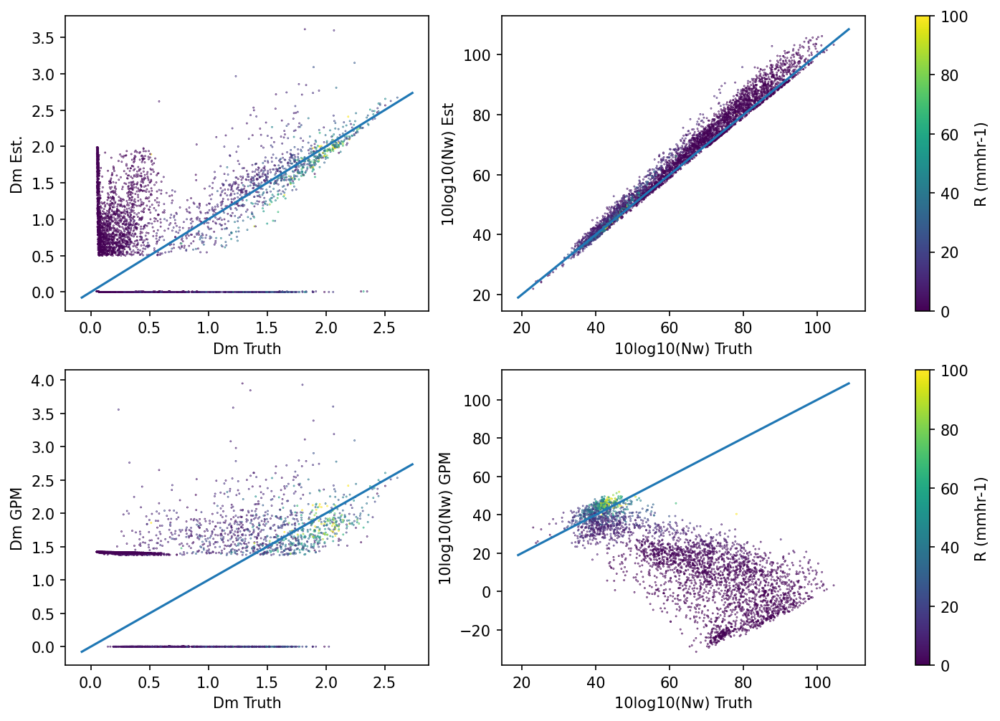

In [20]:
fig, ax = plt.subplots(2, 2, figsize=(12, 8), dpi=150)
sc = ax[0][0].scatter(xr_comb.dm, dm_est, c=xr_comb.r, vmin=0, vmax=100,s=.1)
ax[0][0].set_ylabel('Dm Est.')
ax[0][0].set_xlabel('Dm Truth')
x = np.linspace(*ax[0][0].get_xlim())
ax[0][0].plot(x, x)

sc = ax[0][1].scatter(xr_comb.log10_nw * 10, xr_comb.log10_nw_est, c=xr_comb.r, vmin=0, vmax=100,s=.1)
ax[0][1].set_ylabel('10log10(Nw) Est')
ax[0][1].set_xlabel('10log10(Nw) Truth')
x = np.linspace(*ax[0][1].get_xlim())
ax[0][1].plot(x, x)
plt.colorbar(sc, ax =(ax[0][1], ax[0][0]), label='R (mmhr-1)')

sc = ax[1][0].scatter(xr_comb.dm, xr_gpm.dm_gpm, c=xr_comb.r, vmin=0, vmax=100,s=.1)
ax[1][0].set_ylabel('Dm GPM')
ax[1][0].set_xlabel('Dm Truth')
x = np.linspace(*ax[1][0].get_xlim())
ax[1][0].plot(x, x)

sc = ax[1][1].scatter(xr_comb.log10_nw * 10, xr_gpm.log10_nw_gpm, c=xr_comb.r, vmin=0, vmax=100,s=.1)
ax[1][1].set_ylabel('10log10(Nw) GPM')
ax[1][1].set_xlabel('10log10(Nw) Truth')
x = np.linspace(*ax[1][1].get_xlim())
ax[1][1].plot(x, x)
plt.colorbar(sc, ax =(ax[1][1], ax[1][0]), label='R (mmhr-1)')

# plt.savefig('../results/nw_gpm.png')
# plt.show()
# plt.colorbar(sc, label='R (mmhr-1)')
# plt.savefig('../results/dm_est.png')
# plt.show()


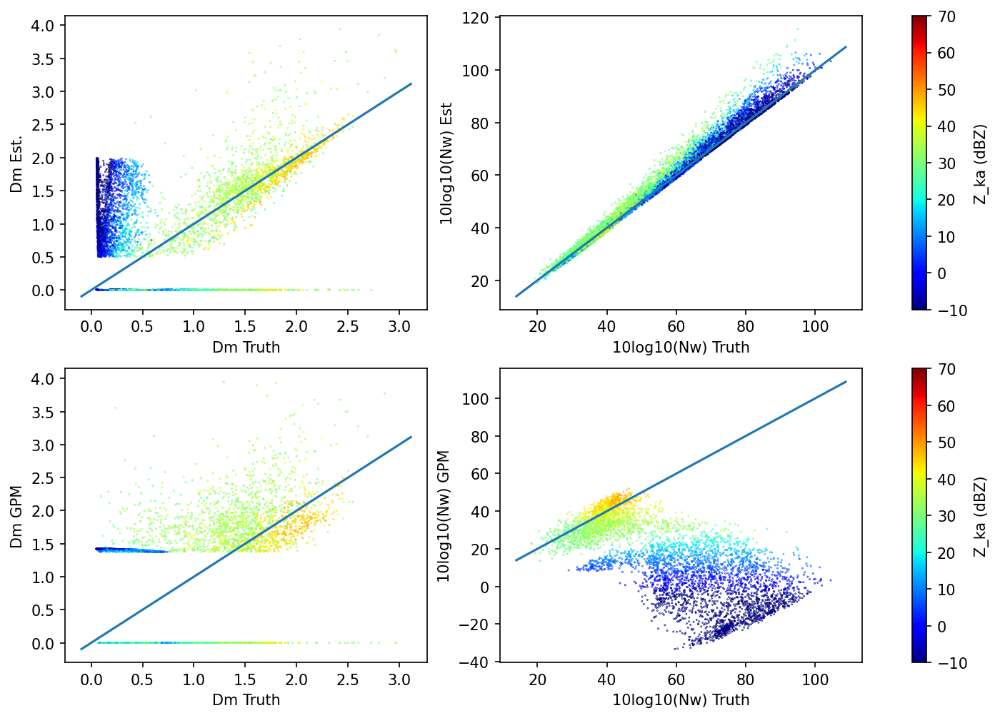

In [21]:
fig, ax = plt.subplots(2, 2, figsize=(12, 8), dpi=150)
sc = ax[0][0].scatter(xr_comb.dm, dm_est, c=xr_comb.dbz_t_ka, vmin=-10, vmax=70, s=.1, cmap='jet')
ax[0][0].set_ylabel('Dm Est.')
ax[0][0].set_xlabel('Dm Truth')
x = np.linspace(*ax[0][0].get_xlim())
ax[0][0].plot(x, x)

sc = ax[0][1].scatter(xr_comb.log10_nw * 10, xr_comb.log10_nw_est, c=xr_comb.dbz_t_ka, vmin=-10, vmax=70, s=.1, cmap='jet')
ax[0][1].set_ylabel('10log10(Nw) Est')
ax[0][1].set_xlabel('10log10(Nw) Truth')
x = np.linspace(*ax[0][1].get_xlim())
ax[0][1].plot(x, x)
plt.colorbar(sc, ax =(ax[0][1], ax[0][0]), label='Z_ka (dBZ)')

sc = ax[1][0].scatter(xr_comb.dm, xr_gpm.dm_gpm, c=xr_comb.dbz_t_ka, vmin=-10, vmax=70, s=.1, cmap='jet')
ax[1][0].set_ylabel('Dm GPM')
ax[1][0].set_xlabel('Dm Truth')
x = np.linspace(*ax[1][0].get_xlim())
ax[1][0].plot(x, x)

sc = ax[1][1].scatter(xr_comb.log10_nw * 10, xr_gpm.log10_nw_gpm, c=xr_comb.dbz_t_ka, vmin=-10, vmax=70, s=.1, cmap='jet')
ax[1][1].set_ylabel('10log10(Nw) GPM')
ax[1][1].set_xlabel('10log10(Nw) Truth')
x = np.linspace(*ax[1][1].get_xlim())
ax[1][1].plot(x, x)
plt.colorbar(sc, ax =(ax[1][1], ax[1][0]), label='Z_ka (dBZ)')


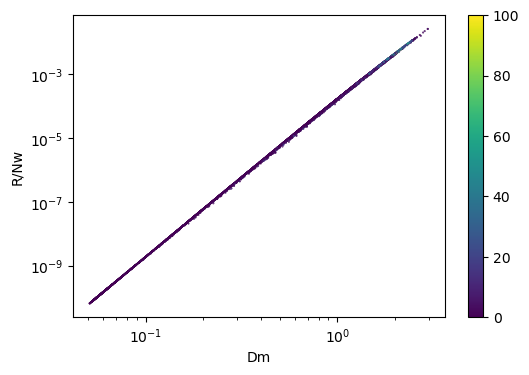

In [22]:
fig, ax = plt.subplots(dpi=100)
sc = ax.scatter(xr_comb.dm, xr_comb.r / xr_comb.nw, s=0.2, c=xr_comb.r, vmin=0, vmax=100)
ax.set_yscale('log')
ax.set_xscale('log')
ax.set_ylabel('R/Nw')
ax.set_xlabel('Dm')
plt.colorbar(sc)

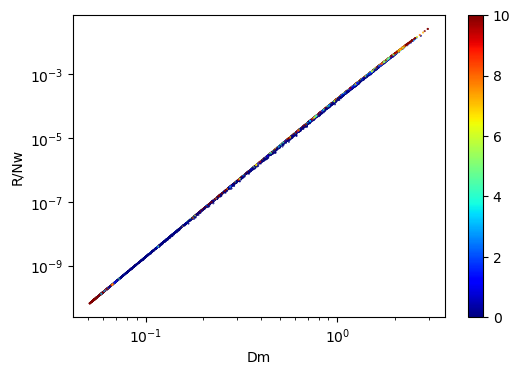

In [23]:
fig, ax = plt.subplots(dpi=100)
sc = ax.scatter(xr_comb.dm, xr_comb.r / xr_comb.nw, s=0.2, c=xr_comb.mu, vmin=0, vmax=10, cmap='jet')
ax.set_yscale('log')
ax.set_xscale('log')
ax.set_ylabel('R/Nw')
ax.set_xlabel('Dm')
plt.colorbar(sc)

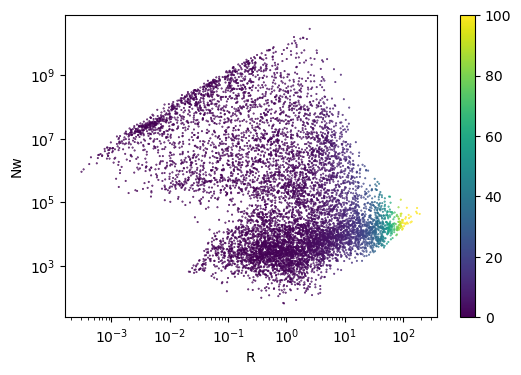

In [24]:
fig, ax = plt.subplots(dpi=100)
sc = ax.scatter(xr_comb.r,  xr_comb.nw, s=0.2, c=xr_comb.r, vmin=0, vmax=100)
ax.set_yscale('log')
ax.set_xscale('log')
ax.set_ylabel('Nw')
ax.set_xlabel('R')
plt.colorbar(sc)

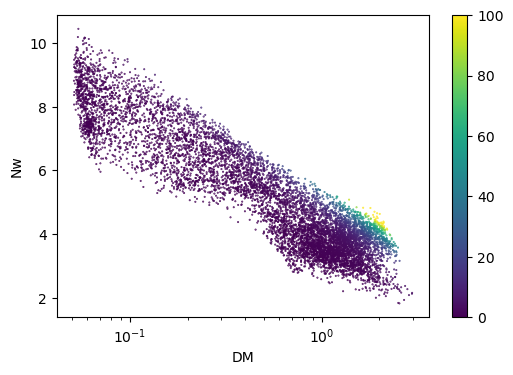

In [41]:
fig, ax = plt.subplots(dpi=100)
sc = ax.scatter(xr_comb.dm,  np.log10(xr_comb.nw), s=0.2, c=xr_comb.r, vmin=0, vmax=100)
# ax.set_yscale('log')
ax.set_xscale('log')
ax.set_ylabel('Nw')
ax.set_xlabel('DM')
plt.colorbar(sc)

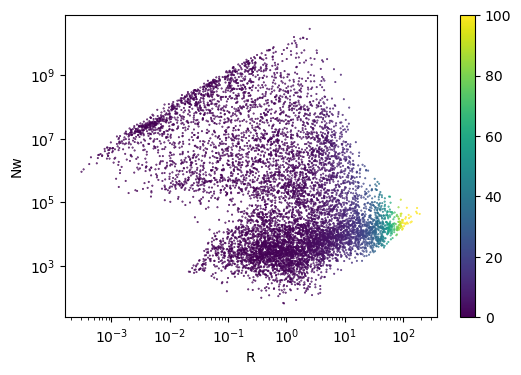

In [26]:
fig, ax = plt.subplots(dpi=100)
sc = ax.scatter(xr_comb.r,  xr_comb.nw, s=0.2, c=xr_comb.r, vmin=0, vmax=100)
ax.set_yscale('log')
ax.set_xscale('log')
ax.set_ylabel('Nw')
ax.set_xlabel('R')
plt.colorbar(sc)

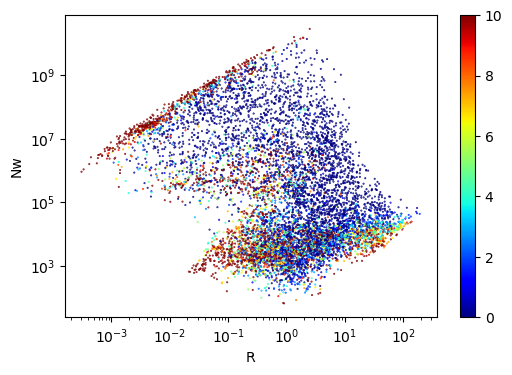

In [27]:
fig, ax = plt.subplots(dpi=100)
sc = ax.scatter(xr_comb.r,  xr_comb.nw, s=0.2, c=xr_comb.mu, vmin=0, vmax=10, cmap='jet')
ax.set_yscale('log')
ax.set_xscale('log')
ax.set_ylabel('Nw')
ax.set_xlabel('R')
plt.colorbar(sc)

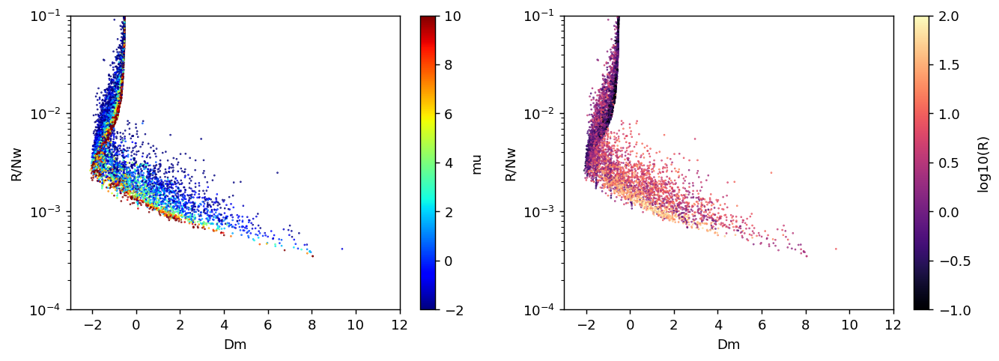

In [28]:
fig, (ax, ax1) = plt.subplots(1, 2, dpi=130, figsize=(12, 4))
sc = ax.scatter(xr_comb.dbz_t_ku - xr_comb.dbz_t_ka, 
                xr_comb.r / (10 ** (xr_comb.dbz_t_ku /10)), s=0.2, 
                c=xr_comb.mu, vmin=-2, vmax=10, cmap='jet')

sc2 = ax1.scatter(xr_comb.dbz_t_ku - xr_comb.dbz_t_ka, 
                xr_comb.r / (10 ** (xr_comb.dbz_t_ku /10)), s=0.2, 
                c=np.log10(xr_comb.r), vmin=-1, vmax=2, cmap='magma')
ax.set_yscale('log')
# ax.set_xscale('log')
ax.set_ylabel('R/Nw')
ax.set_xlabel('Dm')
ax.set_xlim(-3, 12)
ax.set_ylim(1e-4, 1e-1)
plt.colorbar(sc, ax=ax, label='mu')

ax1.set_yscale('log')
# ax.set_xscale('log')
ax1.set_ylabel('R/Nw')
ax1.set_xlabel('Dm')
ax1.set_xlim(-3, 12)
ax1.set_ylim(1e-4, 1e-1)
plt.colorbar(sc2, ax=ax1, label='log10(R)')

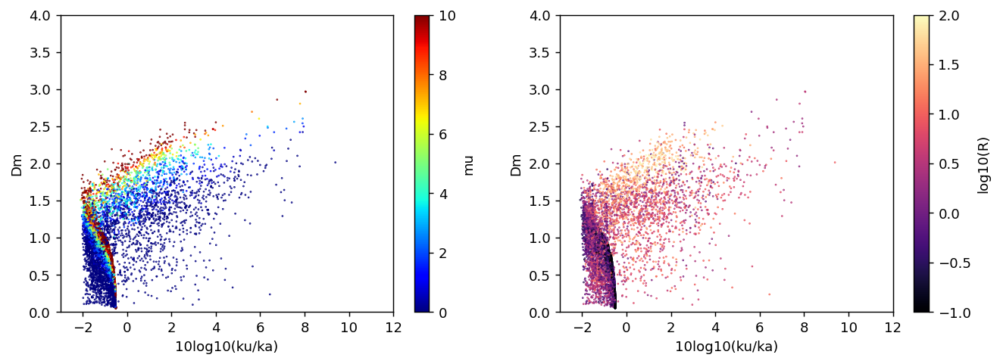

In [29]:
fig, (ax, ax1) = plt.subplots(1, 2, dpi=130, figsize=(12, 4))

sc = ax.scatter(
                xr_comb.dbz_t_ku - xr_comb.dbz_t_ka, 
                xr_comb.dm, s=0.2, 
                c=xr_comb.mu, vmin=0, vmax=10, cmap='jet')

ax.set_ylabel('Dm')
ax.set_xlabel('10log10(ku/ka)')
ax.set_xlim(-3, 12)
ax.set_ylim(0, 4)
plt.colorbar(sc, ax=ax, label='mu')

sc2 = ax1.scatter(
                xr_comb.dbz_t_ku - xr_comb.dbz_t_ka, 
                xr_comb.dm, s=0.2, 
                c=np.log10(xr_comb.r), vmin=-1, vmax=2, cmap='magma')

ax1.set_ylabel('Dm')
ax1.set_xlabel('10log10(ku/ka)')
ax1.set_xlim(-3, 12)
ax1.set_ylim(0, 4)
plt.colorbar(sc2, ax=ax1, label='log10(R)')

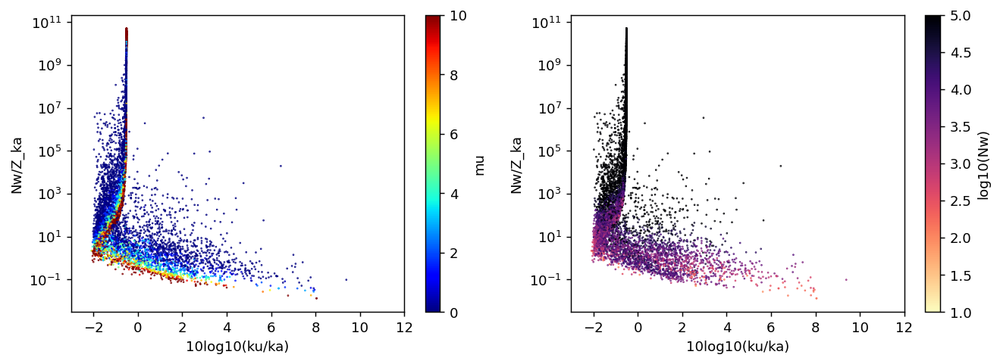

In [30]:
fig, (ax, ax1) = plt.subplots(1, 2, dpi=130, figsize=(12, 4))
sc = ax.scatter(
                xr_comb.dbz_t_ku - xr_comb.dbz_t_ka, 
                xr_comb.nw / 10 **(xr_comb.dbz_t_ku/ 10), s=0.2, 
                c=xr_comb.mu, vmin=0, vmax=10, cmap='jet')
ax.set_yscale('log')
# ax.set_xscale('log')
ax.set_ylabel('Nw/Z_ka')
ax.set_xlabel('10log10(ku/ka)')
ax.set_xlim(-3, 12)
# ax.set_ylim(0, 4)
plt.colorbar(sc,ax=ax, label='mu')

sc2 = ax1.scatter(
                xr_comb.dbz_t_ku - xr_comb.dbz_t_ka, 
                xr_comb.nw / 10 **(xr_comb.dbz_t_ku/ 10), s=0.2, 
                c=np.log10(xr_comb.nw), vmin=1, vmax=5, cmap='magma_r')
ax1.set_yscale('log')
ax1.set_ylabel('Nw/Z_ka')
ax1.set_xlabel('10log10(ku/ka)')
ax1.set_xlim(-3, 12)
plt.colorbar(sc2, ax=ax1, label='log10(Nw)')

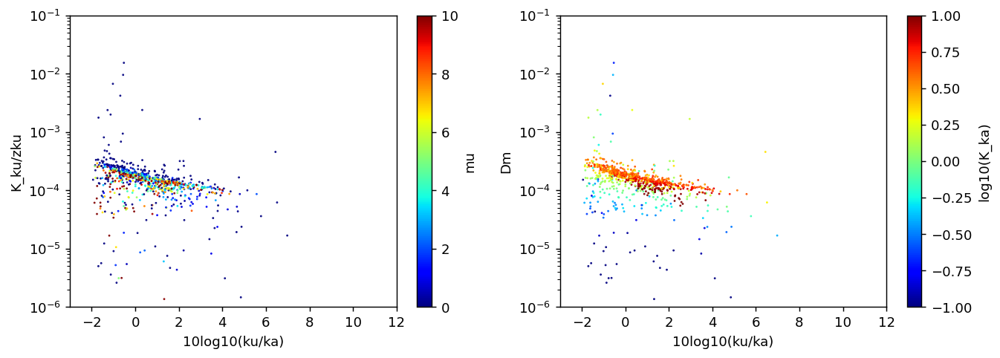

In [31]:
fig, (ax, ax1) = plt.subplots(1, 2, dpi=130, figsize=(12, 4))
sc = ax.scatter(
                xr_comb.dbz_t_ku - xr_comb.dbz_t_ka, 
                xr_comb.Att_ku / 10 **(xr_comb.dbz_t_ku/ 10), s=0.3, 
                c=xr_comb.mu, vmin=0, vmax=10, cmap='jet')

ax.set_yscale('log')
ax.set_ylabel('K_ku/zku')
ax.set_xlabel('10log10(ku/ka)')
ax.set_xlim(-3, 12)
ax.set_ylim(1e-6, 1e-1)
plt.colorbar(sc,ax=ax, label='mu')

sc2 = ax1.scatter(
                xr_comb.dbz_t_ku - xr_comb.dbz_t_ka, 
                xr_comb.Att_ku / 10 **(xr_comb.dbz_t_ku/ 10), s=0.3, 
                c=np.log10(xr_comb.Att_ku), vmin=-1, vmax=1, cmap='jet')
ax1.set_yscale('log')
ax1.set_ylabel('Dm')
ax1.set_xlabel('10log10(ku/ka)')
ax1.set_xlim(-3, 12)
ax1.set_ylim(1e-6, 1e-1)
plt.colorbar(sc2, ax=ax1, label='log10(K_ka)')

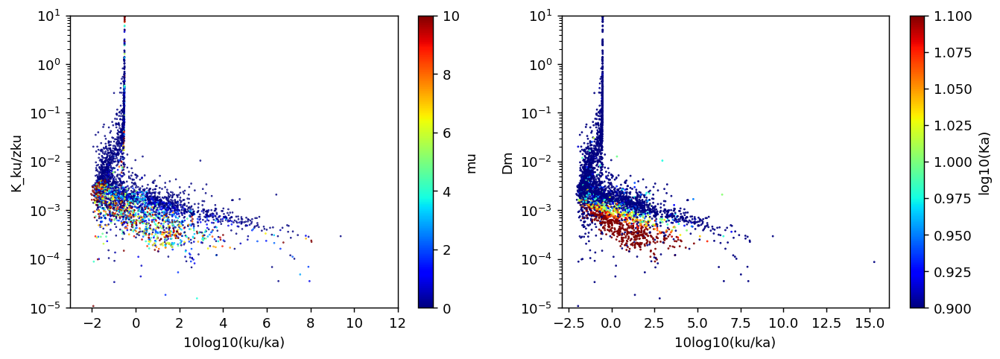

In [32]:
fig, (ax, ax1) = plt.subplots(1, 2, dpi=130, figsize=(12, 4))
sc = ax.scatter(
                xr_comb.dbz_t_ku - xr_comb.dbz_t_ka, 
                xr_comb.Att_ka / 10 **(xr_comb.dbz_t_ku/ 10), s=0.2, 
                c=xr_comb.mu, vmin=0, vmax=10, cmap='jet')
ax.set_yscale('log')
ax.set_ylabel('K_ku/zku')
ax.set_xlabel('10log10(ku/ka)')
ax.set_xlim(-3, 12)
ax.set_ylim(1e-5, 1e1)
plt.colorbar(sc,ax=ax, label='mu')

sc2 = ax1.scatter(
                xr_comb.dbz_t_ku - xr_comb.dbz_t_ka, 
                xr_comb.Att_ka / 10 **(xr_comb.dbz_t_ku/ 10), s=0.3, 
                c=np.log10(xr_comb.Att_ka), vmin=1, vmax=1, cmap='jet')
ax1.set_yscale('log')
ax1.set_ylabel('Dm')
ax1.set_xlabel('10log10(ku/ka)')
ax.set_xlim(-3, 12)
ax1.set_ylim(1e-5, 1e1)
plt.colorbar(sc2, ax=ax1, label='log10(Ka)')

In [33]:
r = 6 * np.pi * np.sum((10 ** xr_gpm.log10_nw_gpm * (6 * (3 + 4) ** (3 + 4))/(4 **4 * gamma(3 + 4) )))

In [34]:
dfr = xr_comb.dbz_t_ku - xr_comb.dbz_t_ka

In [35]:
dfr.min().values

array(-2.08739953)

In [36]:
dfr.max().values

array(15.28232278)

In [37]:
dfr_array = np.arange(-2.5, 15, 0.5)

In [ ]:
for i in dfr_array:
    